# CITIES AND COUNTRIES GRAPH

## CREATING THE GRAPH

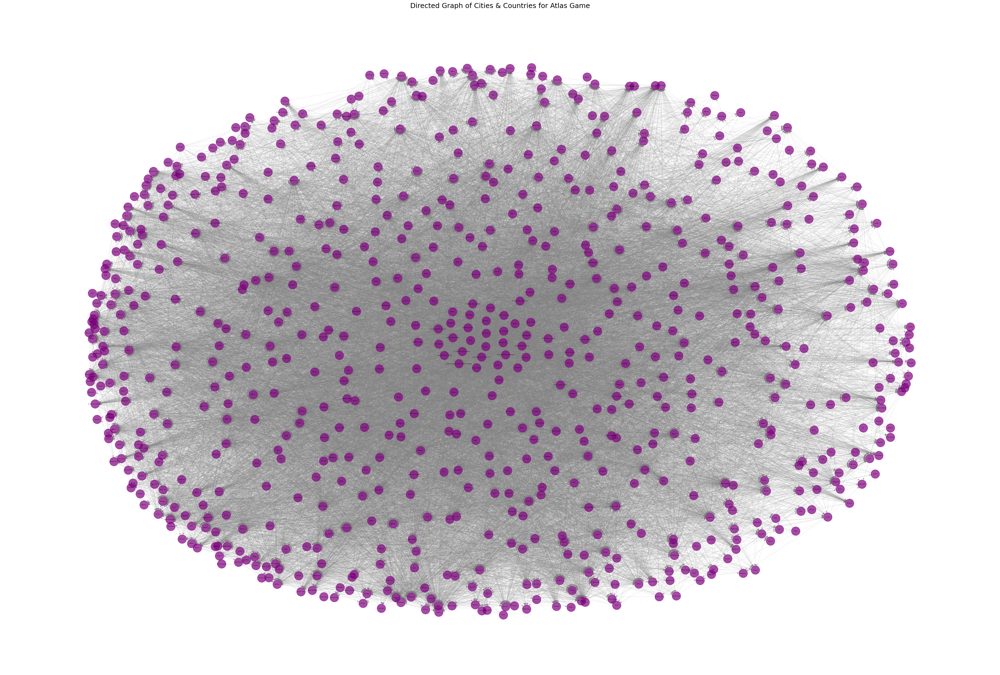

Number of nodes (places): 758
Number of edges: 22189


In [2]:

import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load merged city and country data
file_path = "./data/cities_and_countries.csv"  # Replace with your actual file path
df = pd.read_csv(file_path)

# Extract place names (cities + countries)
places = df['place'].str.strip().tolist()
# print(places)

# Create a directed graph
G_places = nx.DiGraph()

# Add edges based on the Atlas game rule
for place in places:
    last_letter = place[-1].lower()
    for other_place in places:
        if other_place[0].lower() == last_letter and place != other_place:
            G_places.add_edge(place, other_place)

# Plot the graph
plt.figure(figsize=(36, 24))  # Large figure size for better visibility
pos = nx.spring_layout(G_places, k=1.2, seed=42)  # Spring layout for better spacing
nx.draw(
    G_places, pos, with_labels=True, node_size=500, node_color='purple',
    edge_color='gray', font_size=3, font_weight='bold', width=0.2, alpha=0.7
)
plt.title("Directed Graph of Cities & Countries for Atlas Game", fontsize=18)
plt.show()

# Basic graph information
print(f"Number of nodes (places): {G_places.number_of_nodes()}")
print(f"Number of edges: {G_places.number_of_edges()}")


## GENERIC TWO-PLAYER SIMULATION

In [3]:
import random
# Function to simulate a single game
def simulate_game(graph, start_city, smart_player_move, dumb_player_move, max_moves=50, visualize=False):
    current_graph = graph.copy()
    visited = set()
    current_city = start_city
    turn = 0  # 0 = Smart Player, 1 = Random Player

    if visualize:
        print(f"\n🔹 Starting city: {start_city}")

    for move in range(1, max_moves + 1):
        # Determine current player
        if turn == 0:
            next_city = smart_player_move(current_graph, current_city, visited)
        else:
            next_city = random_player_move(current_graph, current_city, visited)

        if next_city is None:  # If a player has no valid moves, they lose
            return turn  # Return the player number (0 = Smart, 1 = Random) who lost

        # Remove current city from graph
        visited.add(current_city)
        current_graph.remove_node(current_city)
        current_city = next_city

        # Switch turns
        turn = 1 - turn  # Alternate between 0 and 1

        if visualize:
            print(f"Move {move}: {'Smart' if turn == 1 else 'Random'} → {current_city}")

    return None  # If the game reaches max moves, it's a draw

# Random Player Strategy: Selects a random valid move
def random_player_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return random.choice(successors)

## IN-DEGREE TO OUT-DEGREE RATIO
- I am not justifying this again. Never doubt the goat.


Top 10 Most Dangerous Trap Cities:
San José: Ratio = 52.00 (In: 52, Out: 0)
Antananarivo: Ratio = 30.20 (In: 151, Out: 4)
Aleppo: Ratio = 30.20 (In: 151, Out: 4)
Yaoundé: Ratio = 25.00 (In: 25, Out: 0)
Nangandao: Ratio = 23.80 (In: 119, Out: 4)
Ningbo: Ratio = 23.80 (In: 119, Out: 4)
Nauru: Ratio = 11.90 (In: 119, Out: 9)
Orlando: Ratio = 11.00 (In: 44, Out: 3)
Ningde: Ratio = 10.82 (In: 119, Out: 10)
Niue: Ratio = 10.82 (In: 119, Out: 10)


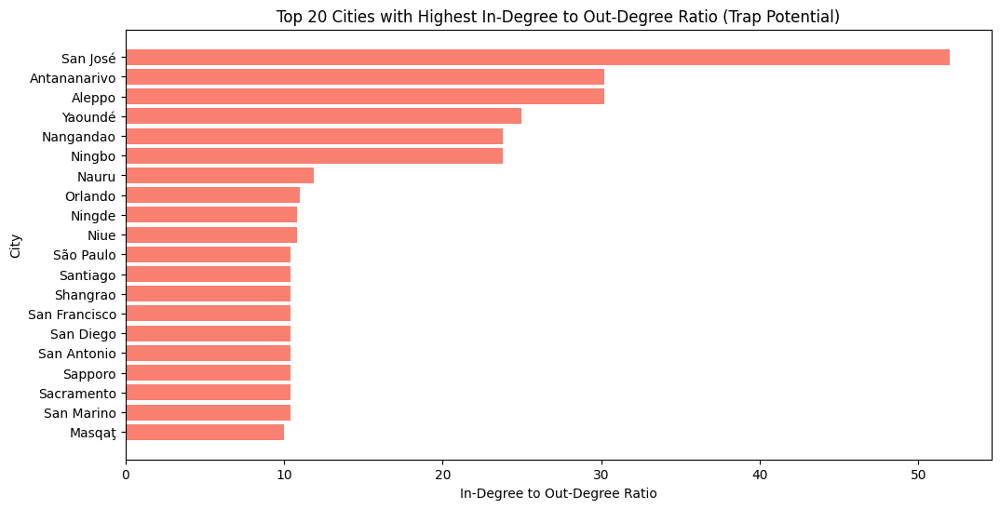

In [10]:
import matplotlib.pyplot as plt
import networkx as nx

# Compute in-degree and out-degree for each city
in_degrees = dict(G_places.in_degree())  # Number of cities leading to this city
out_degrees = dict(G_places.out_degree())  # Number of cities this city leads to

# Calculate In-Degree to Out-Degree Ratio
ratio = {node: in_degrees[node] / (out_degrees[node] + 1) for node in G_places.nodes}  # Adding 1 to prevent division by zero

# Sort cities by highest in-degree to out-degree ratio (most dangerous traps)
sorted_ratio = sorted(ratio.items(), key=lambda x: x[1], reverse=True)

# Display Top 10 Traps
print("\nTop 10 Most Dangerous Trap Cities:")
for city, r in sorted_ratio[:10]:
    print(f"{city}: Ratio = {r:.2f} (In: {in_degrees[city]}, Out: {out_degrees[city]})")
    
# Extract top 20 cities by ratio for visualization
top_cities, top_ratios = zip(*sorted_ratio[:20])

plt.figure(figsize=(12, 6))
plt.barh(top_cities[::-1], top_ratios[::-1], color='salmon')  # Reverse for better visualization
plt.xlabel('In-Degree to Out-Degree Ratio')
plt.ylabel('City')
plt.title('Top 20 Cities with Highest In-Degree to Out-Degree Ratio (Trap Potential)')
plt.show()


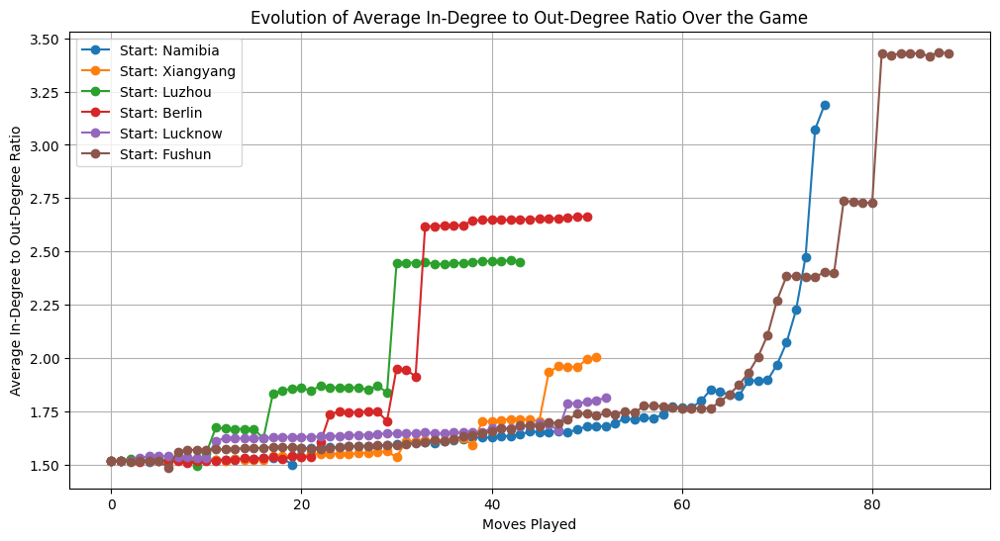

In [38]:
import random
import matplotlib.pyplot as plt

# Function to compute average in-degree to out-degree ratio at a given game state
def compute_avg_ratio(graph):
    if len(graph.nodes) == 0:
        return 0  # No cities left to calculate
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    ratios = [in_degrees[node] / (out_degrees[node] + 1) for node in graph.nodes]  # Avoid division by zero
    return sum(ratios) / len(ratios)  # Compute average ratio

# Function to simulate a game and track ratio evolution
def simulate_game_and_track_ratios(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    current_city = start_city
    visited = set()

    # Track average in-degree to out-degree ratio over time
    avg_ratios = []
    move_number = []

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute average ratio at current time step
        avg_ratio = compute_avg_ratio(current_graph)
        avg_ratios.append(avg_ratio)
        move_number.append(move)

        # Select the best trap move (force opponent into worst position)
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves
        next_city = random.choice(successors)

        # Remove current city to reflect game state
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, avg_ratios

# Run simulation from multiple start points
start_cities = random.sample(list(G_places.nodes), 6)  # Choose 3 random starting cities
simulations = {city: simulate_game_and_track_ratios(G_places, city, max_moves=200) for city in start_cities}

# Plot the evolution of the average in-degree to out-degree ratio
plt.figure(figsize=(12, 6))
for city, (moves, avg_ratios) in simulations.items():
    plt.plot(moves, avg_ratios, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Average In-Degree to Out-Degree Ratio')
plt.title('Evolution of Average In-Degree to Out-Degree Ratio Over the Game')
plt.legend()
plt.grid(True)
plt.show()


In [13]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Function to compute in-degree to out-degree ratio for each city
def compute_ratio(graph):
    in_degrees = dict(graph.in_degree())
    out_degrees = dict(graph.out_degree())
    return {node: in_degrees[node] / (out_degrees[node] + 1) for node in graph.nodes}  # Avoid division by zero

# Smart Player Strategy: Selects the move with the highest in-degree to out-degree ratio
def smart_inout_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return max(successors, key=lambda x: compute_ratio(graph).get(x, 0), default=None)

# Random Player Strategy: Selects a random valid move
def random_player_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    return random.choice(successors)

# Function to simulate multiple games and compute win rates
def simulate_multiple_games(graph, num_games=100):
    start_cities = random.sample(list(graph.nodes), num_games)  # Select random start cities
    smart_wins, random_wins, draws = 0, 0, 0

    for start_city in start_cities:
        result = simulate_game(graph, start_city, smart_inout_move, random_player_move, max_moves=50, visualize=False)

        if result == 0:
            random_wins += 1  # Smart Player lost
        elif result == 1:
            smart_wins += 1  # Random Player lost
        else:
            draws += 1  # Max moves reached

    return smart_wins, random_wins, draws

# Run multiple simulations
num_simulations = 100
smart_wins, random_wins, draws = simulate_multiple_games(G_places, num_games=num_simulations)

# Print win statistics
print(f"\n📊 Simulation Results ({num_simulations} games):")
print(f"✅ Smart Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



📊 Simulation Results (100 games):
✅ Smart Player Wins: 87 (87.00%)
❌ Random Player Wins: 13 (13.00%)
➖ Draws: 0 (0.00%)


## STRONGLY CONNECTED COMPONENTS

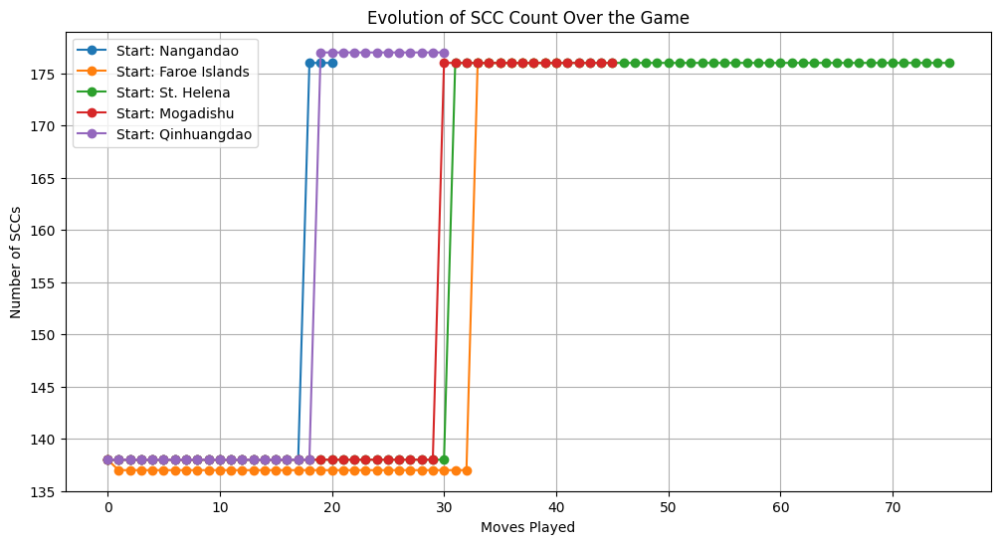

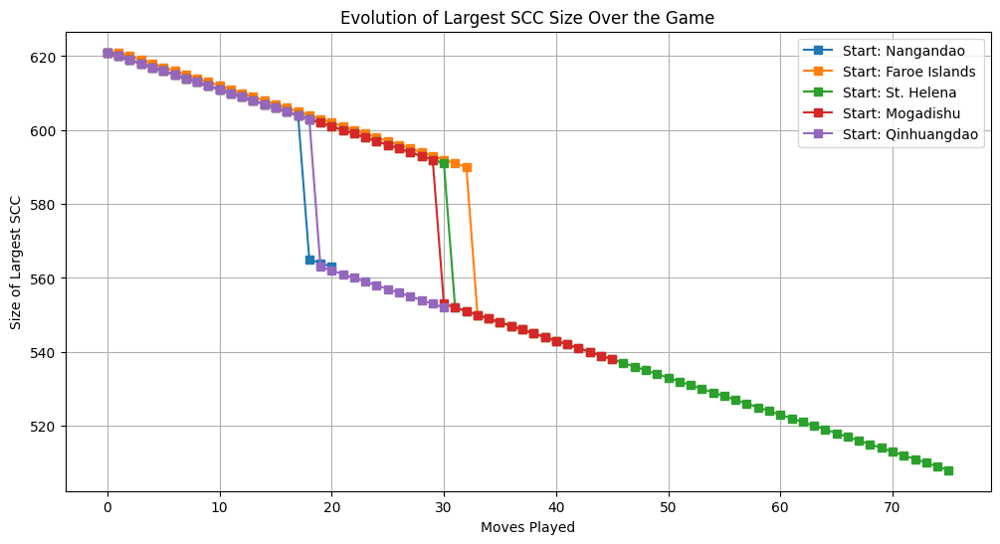

In [37]:
import networkx as nx
import matplotlib.pyplot as plt
import random

sorted_sccs = sorted(list(nx.strongly_connected_components(G_places)), key=len, reverse=True)
# Function to track SCC evolution over time
def simulate_game_and_track_scc_metrics(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    num_sccs = []
    largest_scc_sizes = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute SCC count and largest SCC size at current time step
        sccs = list(nx.strongly_connected_components(current_graph))
        num_sccs.append(len(sccs))
        largest_scc_sizes.append(len(max(sccs, key=len)))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the move that keeps us in the largest SCC
        # next_city = max(successors, key=lambda x: len([scc for scc in sccs if x in scc][0]), default=None)
        next_city = random.choice(successors)

        # Remove current city to reflect game state
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, num_sccs, largest_scc_sizes

# Run multiple simulations to track SCC evolution
start_cities = random.sample(list(G_places.nodes), 5)  # Choose 5 random starting cities
simulations = {city: simulate_game_and_track_scc_metrics(G_places, city, max_moves=100) for city in start_cities}

# Plot SCC evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, scc_counts, largest_sizes) in simulations.items():
    plt.plot(moves, scc_counts, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Number of SCCs')
plt.title('Evolution of SCC Count Over the Game')
plt.legend()
plt.grid(True)
plt.show()

# Plot Largest SCC size over time
plt.figure(figsize=(12, 6))
for city, (moves, scc_counts, largest_sizes) in simulations.items():
    plt.plot(moves, largest_sizes, marker='s', linestyle='-', label=f'Start: {city}')

plt.xlabel('Moves Played')
plt.ylabel('Size of Largest SCC')
plt.title('Evolution of Largest SCC Size Over the Game')
plt.legend()
plt.grid(True)
plt.show()


In [20]:
# Smart Player Strategy: take opponent of the larger SCC as much as possible
def smart_scc_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Choose the move that takes the opponent OUT of the largest SCC
    return min(successors, key=lambda x: len([scc for scc in sorted_sccs if x in scc][0]), default=None)

# Run multiple simulations comparing Smart SCC Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_places.nodes), num_simulations):
    result = simulate_game(G_places, start_city, smart_scc_move, random_player_move, max_moves=50, visualize=False)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\n📊 Smart SCC Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



📊 Smart SCC Player Wins: 99 (99.00%)
❌ Random Player Wins: 1 (1.00%)
➖ Draws: 0 (0.00%)


## BETWEENNESS CENTRALITY


🔹 Top 10 Cities with Highest Betweenness Centrality:
Ecatepec: 0.0462
Riyadh: 0.0379
Dominican Republic: 0.0362
New York: 0.0361
Novosibirsk: 0.0361
Guam: 0.0356
Ahmedabad: 0.0335
Karaj: 0.0330
Algiers: 0.0316
Athens: 0.0316


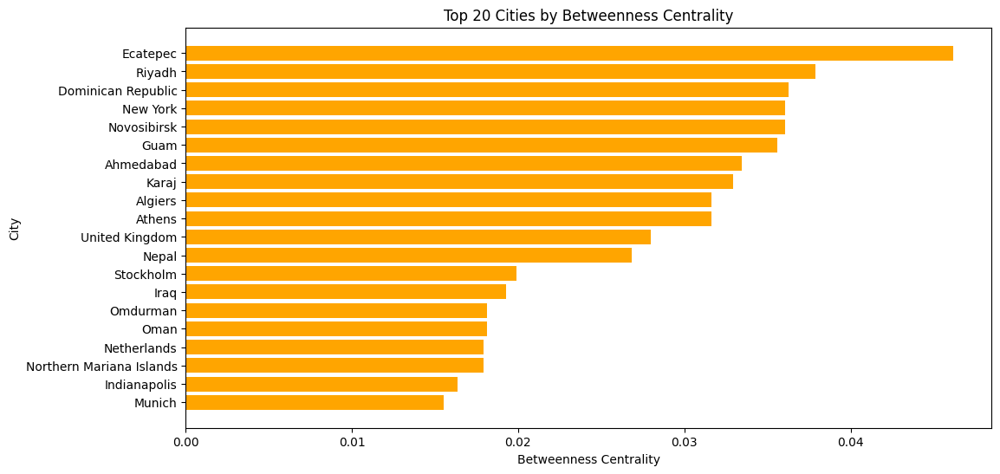

In [21]:
import networkx as nx
import matplotlib.pyplot as plt

# Compute betweenness centrality
betweenness_centrality = nx.betweenness_centrality(G_places)

# Sort nodes by betweenness centrality
sorted_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

# Print Top 10 cities with highest betweenness centrality
print("\n🔹 Top 10 Cities with Highest Betweenness Centrality:")
for city, centrality in sorted_betweenness[:10]:
    print(f"{city}: {centrality:.4f}")

# Visualize Top 20 cities with highest betweenness centrality
plt.figure(figsize=(12, 6))
plt.barh([node for node, _ in sorted_betweenness[:20]][::-1],
         [value for _, value in sorted_betweenness[:20]][::-1], color='orange')

plt.xlabel("Betweenness Centrality")
plt.ylabel("City")
plt.title("Top 20 Cities by Betweenness Centrality")
plt.show()


In [36]:
# Smart Player Strategy: Force opponent into the lowest betweenness centrality move
def smart_betweenness_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute approximate betweenness centrality for speed
    centrality = nx.betweenness_centrality(graph, k=10)

    # Choose the move with the lowest betweenness centrality to trap the opponent
    return min(successors, key=lambda x: centrality.get(x, float('inf')), default=None)

# Run multiple simulations comparing Smart Betweenness Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_places.nodes), num_simulations):
    result = simulate_game(G_places, start_city, smart_betweenness_move, random_player_move, max_moves=100)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\n📊 Smart Betweenness Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"❌ Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"➖ Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



📊 Smart Betweenness Player Wins: 85 (85.00%)
❌ Random Player Wins: 15 (15.00%)
➖ Draws: 0 (0.00%)


## EIGENVECTOR CENTRALITY



🔹 Average Eigenvector Centrality by Ending Letter:


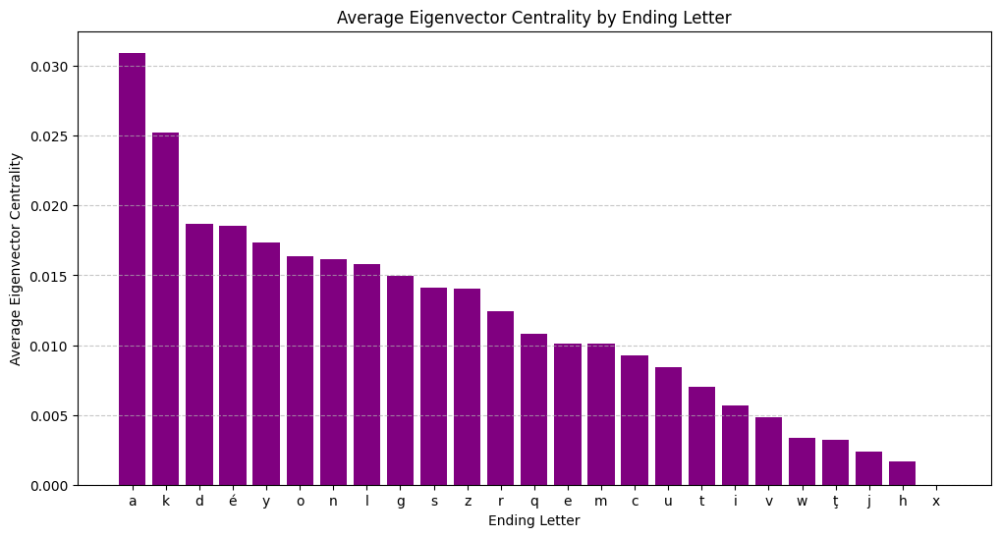

In [30]:
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np


# Compute Eigenvector Centrality with better convergence settings
eigenvector_centrality = nx.eigenvector_centrality(G_places, max_iter=1000, tol=1e-6)

# Group eigenvector centrality values by last letter of city names
ending_letter_eigenvector = defaultdict(list)

for city, score in eigenvector_centrality.items():
    last_letter = city[-1].lower()
    ending_letter_eigenvector[last_letter].append(score)

# Compute the average eigenvector centrality for each ending letter
avg_eigenvector_by_letter = {letter: np.mean(scores) for letter, scores in ending_letter_eigenvector.items()}

# Sort the dictionary by average eigenvector centrality
sorted_letters = sorted(avg_eigenvector_by_letter.items(), key=lambda x: x[1], reverse=True)

# Print sorted average eigenvector centrality by letter
print("\n🔹 Average Eigenvector Centrality by Ending Letter:")
for letter, avg_score in sorted_letters:
    # print(f"{letter.upper()}: {avg_score:.4f}")
    pass

# Extract letters and scores for plotting
letters, avg_scores = zip(*sorted_letters)

# Bar plot of average eigenvector centrality by ending letter
plt.figure(figsize=(12, 6))
plt.bar(letters, avg_scores, color="purple")

plt.xlabel("Ending Letter")
plt.ylabel("Average Eigenvector Centrality")
plt.title("Average Eigenvector Centrality by Ending Letter")
plt.xticks(rotation=0)  # Keep letter labels horizontal
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


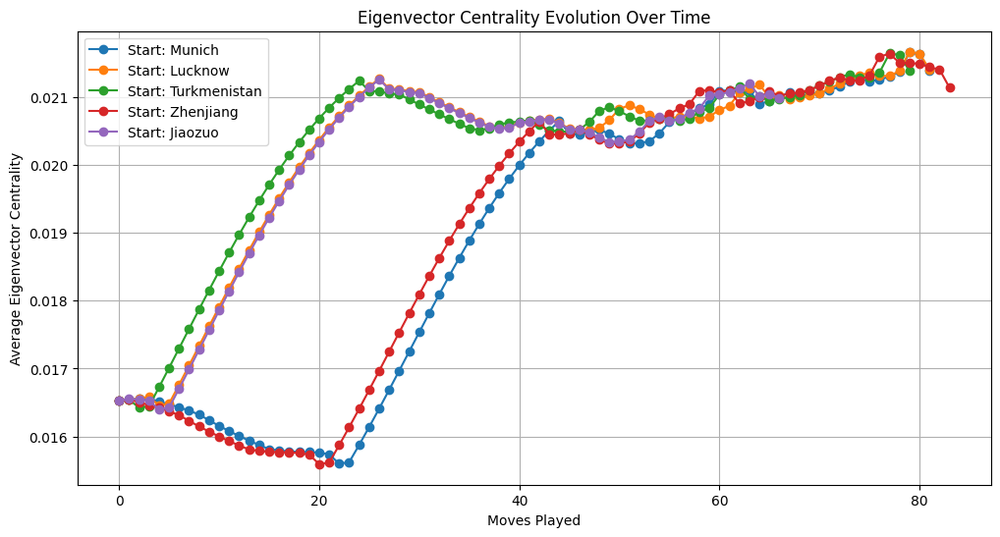

In [39]:
# Function to track Eigenvector Centrality evolution during a game
def simulate_game_and_track_eigenvector(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    avg_eigenvector = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute Eigenvector Centrality at current time step
        eigenvector_scores = nx.eigenvector_centrality(current_graph)
        avg_eigenvector.append(sum(eigenvector_scores.values()) / len(eigenvector_scores))  # Mean Eigenvector Centrality
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the move that forces the opponent into a low-Eigenvector region
        next_city = min(successors, key=lambda x: eigenvector_scores.get(x, float('inf')), default=None)

        # Remove current city from graph
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, avg_eigenvector

# Run multiple simulations and track Eigenvector evolution
start_cities = random.sample(list(G_places.nodes), 5)  # Choose 5 random starting cities
simulations = {city: simulate_game_and_track_eigenvector(G_places, city, max_moves=200) for city in start_cities}

# Plot Eigenvector evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, eigenvector) in simulations.items():
    plt.plot(moves, eigenvector, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Average Eigenvector Centrality")
plt.title("Eigenvector Centrality Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()


In [41]:
ending_letter_EC_dict={}
# Smart Player Strategy: Forces opponent into the lowest Eigenvector city
def smart_eigenvector_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute Eigenvector Centrality
    eigenvector_scores = nx.eigenvector_centrality(graph)

    # Choose the move with the highest Eigenvector Centrality to trap the opponent
    move=max(successors, key=lambda x: eigenvector_scores.get(x, float('-inf')), default=None)
    l=move[-1]
    if l in ending_letter_EC_dict:
        ending_letter_EC_dict[l]+=1
    else:
        ending_letter_EC_dict[l]=1
    return move

# Run multiple simulations comparing Smart Eigenvector Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_places.nodes), num_simulations):
    result = simulate_game(G_places, start_city, smart_eigenvector_move, random_player_move, max_moves=80)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Eigenvector Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")
# print(ending_letter_EC_dict)


Smart Eigenvector Player Wins: 50 (50.00%)
Random Player Wins: 45 (45.00%)
Draws: 5 (5.00%)


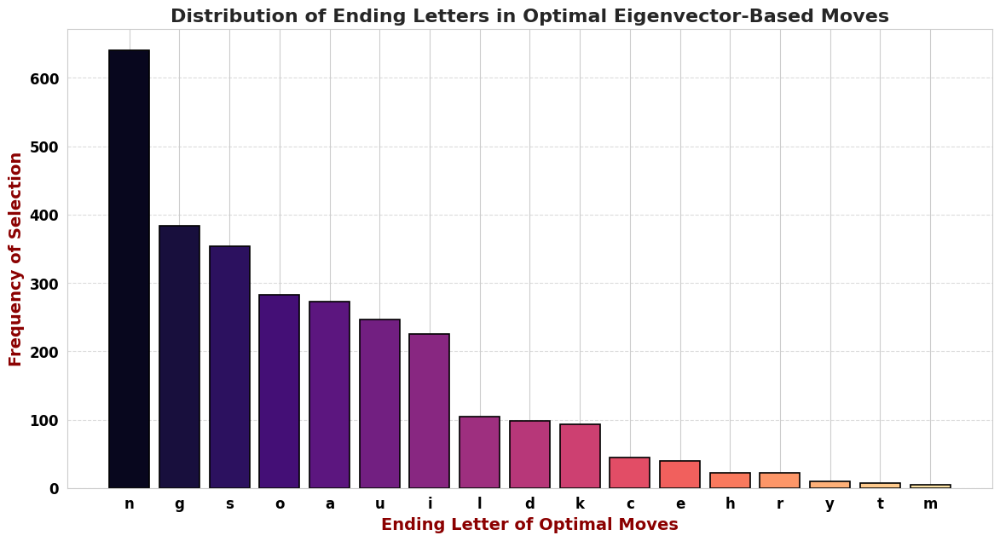

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convert dictionary to sorted list for visualization
sorted_ending_letters = sorted(ending_letter_EC_dict.items(), key=lambda x: x[1], reverse=True)

# Extract letters and counts
letters, counts = zip(*sorted_ending_letters)

# Set figure aesthetics using seaborn
sns.set_style("whitegrid")
plt.figure(figsize=(14, 7))

# Create a **colorful** bar plot
colors = sns.color_palette("magma", len(letters))  # Beautiful color mapping
plt.bar(letters, counts, color=colors, edgecolor="black", linewidth=1.2)

# Title & Labels
plt.xlabel("Ending Letter of Optimal Moves", fontsize=14, fontweight="bold", color="darkred")
plt.ylabel("Frequency of Selection", fontsize=14, fontweight="bold", color="darkred")
plt.title("Distribution of Ending Letters in Optimal Eigenvector-Based Moves", fontsize=16, fontweight="bold")

# Improve aesthetics
plt.xticks(fontsize=12, fontweight="bold", color="black")
plt.yticks(fontsize=12, fontweight="bold", color="black")

# Add grid for readability
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Show the plot
plt.show()


## GRAPH DENSITY


🔹 Initial Graph Density: 0.0387


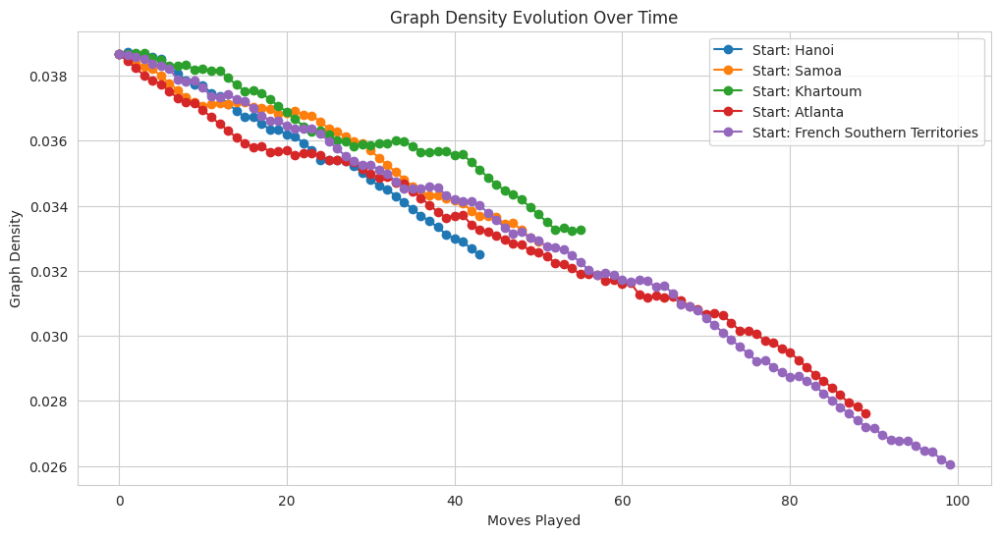

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Compute initial graph density
initial_density = nx.density(G_places)

# Print the density value
print(f"\n🔹 Initial Graph Density: {initial_density:.4f}")

# Function to simulate density change over time
def track_graph_density(graph, start_city, max_moves=100):
    current_graph = graph.copy()
    visited = set()

    densities = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Compute graph density at this time step
        densities.append(nx.density(current_graph))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the next move at random (we are just tracking density)
        next_city = random.choice(successors)

        # Remove current city and move forward
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, densities

# Run multiple simulations to track density changes
start_cities = random.sample(list(G_places.nodes), 5)
simulations = {city: track_graph_density(G_places, city, max_moves=100) for city in start_cities}

# Plot graph density evolution
plt.figure(figsize=(12, 6))
for city, (moves, density) in simulations.items():
    plt.plot(moves, density, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Graph Density")
plt.title("Graph Density Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()

In [50]:
import random
# Smart Player Strategy: Moves that reduce graph density the fastest
def smart_density_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute the density impact of each possible move
    density_drop = {}
    for city in successors:
        temp_graph = graph.copy()
        temp_graph.remove_node(city)
        density_drop[city] = nx.density(temp_graph)

    # Choose the move that causes the **lowest density drop**
    return max(density_drop, key=density_drop.get, default=None)

# Run multiple simulations comparing Smart Density Player vs. Random Player
num_simulations = 100
smart_wins, random_wins, draws = 0, 0, 0

for start_city in random.sample(list(G_places.nodes), num_simulations):
    result = simulate_game(G_places, start_city, smart_density_move, random_player_move, max_moves=100)

    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Density Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")



Smart Density Player Wins: 87 (87.00%)
Random Player Wins: 13 (13.00%)
Draws: 0 (0.00%)


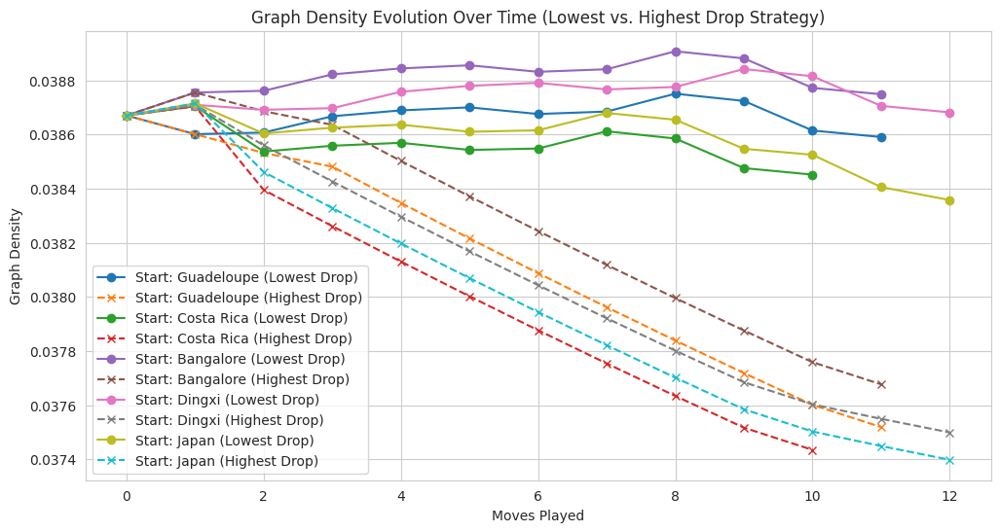

In [51]:
# Function to track density evolution under both strategies
def track_density_comparison(graph, start_city, max_moves=50):
    current_graph_1 = graph.copy()
    current_graph_2 = graph.copy()
    visited_1, visited_2 = set(), set()

    densities_lowest_drop, densities_highest_drop = [], []
    move_number = []

    current_city_1, current_city_2 = start_city, start_city

    for move in range(max_moves):
        if (current_city_1 not in current_graph_1 or not list(current_graph_1.successors(current_city_1))) and \
           (current_city_2 not in current_graph_2 or not list(current_graph_2.successors(current_city_2))):
            break  # No moves left

        # Compute graph density at this time step
        densities_lowest_drop.append(nx.density(current_graph_1))
        densities_highest_drop.append(nx.density(current_graph_2))
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors_1 = [i for i in list(current_graph_1.successors(current_city_1)) if i not in visited_1]
        successors_2 = [i for i in list(current_graph_2.successors(current_city_2)) if i not in visited_2]

        if not successors_1 or not successors_2:
            break  # No valid moves

        # Strategy 1: Choose move with lowest density drop
        density_drop_1 = {city: nx.density(nx.subgraph(current_graph_1, set(current_graph_1.nodes) - {city})) for city in successors_1}
        next_city_1 = max(density_drop_1, key=density_drop_1.get, default=None)

        # Strategy 2: Choose move with highest density drop
        density_drop_2 = {city: nx.density(nx.subgraph(current_graph_2, set(current_graph_2.nodes) - {city})) for city in successors_2}
        next_city_2 = min(density_drop_2, key=density_drop_2.get, default=None)

        # Remove current cities and move forward
        if next_city_1:
            current_graph_1.remove_node(current_city_1)
            visited_1.add(current_city_1)
            current_city_1 = next_city_1

        if next_city_2:
            current_graph_2.remove_node(current_city_2)
            visited_2.add(current_city_2)
            current_city_2 = next_city_2

    return move_number, densities_lowest_drop, densities_highest_drop

# Run density tracking simulation for multiple start cities
start_cities = random.sample(list(G_places.nodes), 5)
simulations = {city: track_density_comparison(G_places, city, max_moves=100) for city in start_cities}

# Plot graph density evolution for both strategies
plt.figure(figsize=(12, 6))
for city, (moves, density_lowest, density_highest) in simulations.items():
    plt.plot(moves, density_lowest, marker='o', linestyle='-', label=f'Start: {city} (Lowest Drop)')
    plt.plot(moves, density_highest, marker='x', linestyle='--', label=f'Start: {city} (Highest Drop)')

plt.xlabel("Moves Played")
plt.ylabel("Graph Density")
plt.title("Graph Density Evolution Over Time (Lowest vs. Highest Drop Strategy)")
plt.legend()
plt.grid(True)
plt.show()


## ALGEBRAIC CONNECTIVITY / FIEDLER VALUE


🔹 Algebraic Connectivity: 3.6332


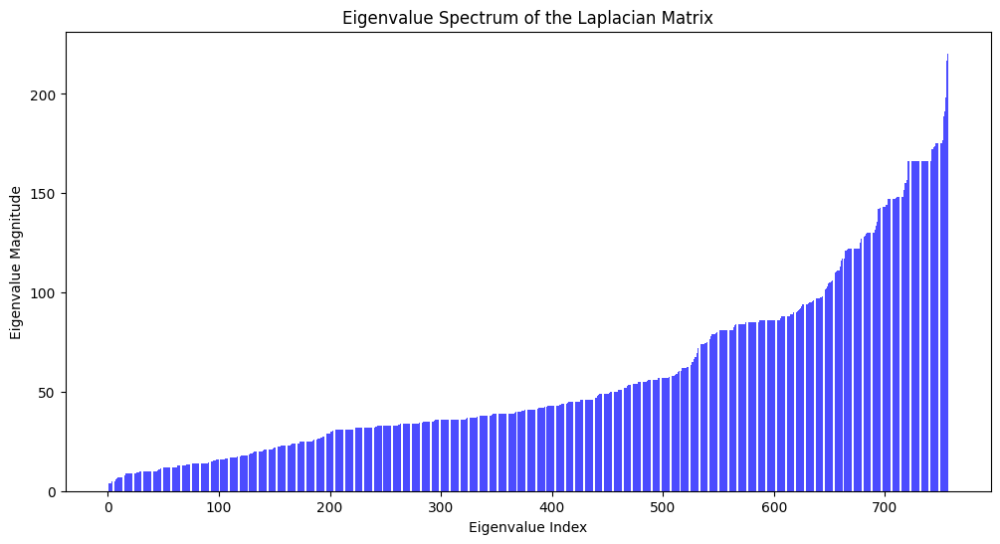

In [5]:
import networkx as nx
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt

G = G_places.copy()
# Convert directed graph to undirected for algebraic connectivity computation
G_undirected = G.to_undirected()

# Compute Laplacian matrix
L = nx.laplacian_matrix(G_undirected).toarray()

# Compute eigenvalues of Laplacian matrix
eigenvalues = np.linalg.eigvals(L)
eigenvalues.sort()

# Algebraic connectivity is the second smallest eigenvalue
algebraic_connectivity = eigenvalues[1] if len(eigenvalues) > 1 else 0

print(f"\n🔹 Algebraic Connectivity: {algebraic_connectivity:.4f}")

# Visualize Eigenvalue Spectrum
plt.figure(figsize=(12, 6))
plt.bar(range(len(eigenvalues)), eigenvalues, color='blue', alpha=0.7)
plt.xlabel("Eigenvalue Index")
plt.ylabel("Eigenvalue Magnitude")
plt.title("Eigenvalue Spectrum of the Laplacian Matrix")
plt.show()


/home/i-am-space/IIIT/ATLAS/.venv/lib/python3.12/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/i-am-space/IIIT/ATLAS/.venv/lib/python3.12/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


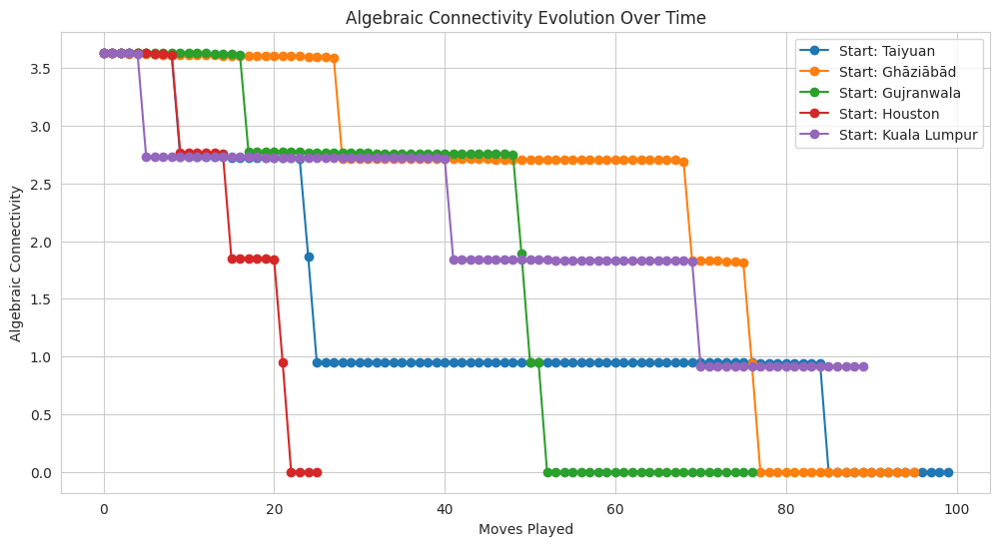

In [55]:
import random
# Function to track algebraic connectivity over time
def track_algebraic_connectivity(graph, start_city, max_moves=50):
    current_graph = graph.copy()
    visited = set()

    connectivity_values = []
    move_number = []

    current_city = start_city

    for move in range(max_moves):
        if current_city not in current_graph or not list(current_graph.successors(current_city)):
            break  # No moves left

        # Convert to undirected and compute algebraic connectivity
        G_undirected = current_graph.to_undirected()
        L = nx.laplacian_matrix(G_undirected).toarray()
        eigenvalues = np.linalg.eigvals(L)
        eigenvalues.sort()
        algebraic_conn = eigenvalues[1] if len(eigenvalues) > 1 else 0

        connectivity_values.append(algebraic_conn)
        move_number.append(move)

        # Ensure we only select unvisited successors
        successors = [i for i in list(current_graph.successors(current_city)) if i not in visited]
        if not successors:
            break  # No valid moves

        # Choose the next move at random (we are just tracking graph evolution)
        next_city = random.choice(successors)

        # Remove current city and move forward
        current_graph.remove_node(current_city)
        visited.add(current_city)
        current_city = next_city

    return move_number, connectivity_values

# Run multiple simulations for different starting cities
start_cities = random.sample(list(G.nodes), 5)
simulations = {city: track_algebraic_connectivity(G, city, max_moves=100) for city in start_cities}

# Plot algebraic connectivity evolution over time
plt.figure(figsize=(12, 6))
for city, (moves, connectivity_values) in simulations.items():
    plt.plot(moves, connectivity_values, marker='o', linestyle='-', label=f'Start: {city}')

plt.xlabel("Moves Played")
plt.ylabel("Algebraic Connectivity")
plt.title("Algebraic Connectivity Evolution Over Time")
plt.legend()
plt.grid(True)
plt.show()


In [6]:
import random
# Smart Player Strategy: Moves that reduce the opponent's algebraic connectivity
def smart_algebraic_connectivity_move(graph, current_city, visited):
    successors = [i for i in list(graph.successors(current_city)) if i not in visited]
    if not successors:
        return None  # No valid moves

    # Compute algebraic connectivity impact of each move
    connectivity_impact = {}
    for city in successors:
        temp_graph = graph.copy()
        temp_graph.remove_node(city)

        # Compute new algebraic connectivity
        G_undirected = temp_graph.to_undirected()
        L = nx.laplacian_matrix(G_undirected).toarray()
        eigenvalues = np.linalg.eigvals(L)
        eigenvalues.sort()
        algebraic_conn = eigenvalues[1] if len(eigenvalues) > 1 else 0

        connectivity_impact[city] = algebraic_conn

    # Choose the move that maximizes algebraic connectivity
    return max(connectivity_impact, key=connectivity_impact.get, default=None)

# Run multiple simulations comparing Smart Algebraic Player vs. Random Player
num_simulations = 50 # reduced the number of simulations because ts pmo fr
smart_wins, random_wins, draws = 0, 0, 0
i=0
for start_city in random.sample(list(G.nodes), num_simulations):
    result = simulate_game(G, start_city, smart_algebraic_connectivity_move, random_player_move, max_moves=100)
    i+=1
    print("Game number",i,"concluded")
    if result == 0:
        random_wins += 1  # Smart Player lost
    elif result == 1:
        smart_wins += 1  # Random Player lost
    else:
        draws += 1  # Max moves reached

# Print results
print(f"\nSmart Algebraic Player Wins: {smart_wins} ({(smart_wins / num_simulations) * 100:.2f}%)")
print(f"Random Player Wins: {random_wins} ({(random_wins / num_simulations) * 100:.2f}%)")
print(f"Draws: {draws} ({(draws / num_simulations) * 100:.2f}%)")


Game number 1 concluded
Game number 2 concluded
Game number 3 concluded
Game number 4 concluded
Game number 5 concluded
Game number 6 concluded
Game number 7 concluded
Game number 8 concluded
Game number 9 concluded
Game number 10 concluded
Game number 11 concluded
Game number 12 concluded
Game number 13 concluded
Game number 14 concluded
Game number 15 concluded
Game number 16 concluded
Game number 17 concluded
Game number 18 concluded
Game number 19 concluded
Game number 20 concluded
Game number 21 concluded
Game number 22 concluded
Game number 23 concluded
Game number 24 concluded
Game number 25 concluded
Game number 26 concluded
Game number 27 concluded
Game number 28 concluded
Game number 29 concluded
Game number 30 concluded
Game number 31 concluded
Game number 32 concluded
Game number 33 concluded
Game number 34 concluded
Game number 35 concluded
Game number 36 concluded
Game number 37 concluded
Game number 38 concluded
Game number 39 concluded
Game number 40 concluded
Game numb

## FINAL BATTLE
- The one and only true fitting conclusion to the relentless pursuit of geographic perfection that we have thus far relentlessly pursued.
- The closest we have gotten to the true, raw game of Atlas as it should always be played.
- The question still remains- can you win? If your back is to the wall and all hope is lost, if the curtains are beginning to close and the lights are beginning to dim, do you have it in you to come out on top?
- There is only one way to find out.

- Nevermind i got lazy the winner is algebraic connectivity everyone cheer!